# TOC

# Code outline for us
1. Step one:
1- Data must be a kind of big data. Review the V’s (volume, variety, velocity, veracity,
value). Make sure to select a dataset that has some features of big data.


--> Say that you had the other dataset also but we took this one because features are good and all
--> We have volume, variety, veracity, value (give example of that HSC project)
This step has 20 points.

2. Step two:
After selecting your topic, you must conduct research to find available/possible solutions. Make
a list of available/possible solutions and report the followings:
1- A brief explanation of the solutions. 
--> https://www.kaggle.com/code/zainhana/customer-segmentation-with-kkn-method-final-resul/notebook

Here they have used clustering, but we have labelled data so we coukd have used classification.

2- A justification that each solution addresses the problem properly, and there are no false
assumptions.
--> THIS WILL BE DONE ONLY AFTER WRITING THE CODE

3- List the strengths and weaknesses of each solution. You can provide evidence from their
reports or your own judgment.
--> THIS WILL BE DONE ONLY AFTER WRITING THE CODE

4- Select one solution to your problem. This can come from the solutions you have found or
your own innovative approach, which we highly encourage.
Don’t forget to include the references of the solutions you found.
This step has 20 points.
--> THIS WILL BE DONE ONLY AFTER WRITING THE CODE


3. Step three:
Either selecting an approach from your research or your own solution, you must explain it in
detail here. Pay attention to the following items:
1- Explain the solution in a general way and draw a big picture of the solution for your
reader. You can include some high-level diagrams, such as a data flow diagram.
--> THIS WILL BE DONE ONLY AFTER WRITING THE CODE

2- Explain each component of the big picture. Make sure to explain the objective and reason
that each component should be part of the solution.
--> THIS WILL BE DONE ONLY AFTER WRITING THE CODE

3- Use some sample data and explain how your solution resolves that sample data.
--> ASK TO PROF WHAT IS SAMPLE DATA <--

This step has 20 points.



4. Step four:
Here you explain your data and evaluate your model. 
- EVALUATE and compare models, explain which eval metrics were chosen and why they were chosen
- Which is the best eva metric and why 
Important notes:

1- Check if the data preprocessing is suitable for the topic of the dataset and models used.
- Ctrl C-V
2- Check if dataset is balanced or unbalanced.
- Ctrl C-V
3- Check if the evaluation metric is suitable for the data and models.
- Ctrl C-V
4- Do a list of what are you analysing and the conclusions you get from that. This will help
to organize your thoughts).
- Ctrl C-V
This step has 20 points.


5. Step five:
In this step, you explain the problem and solutions briefly. Then you tell your conclusions to the
reader. Now, you can add future works that can be done after this research. This can be in
connection with the weaknesses that you find in the selected approach. Notes about future works:
1- Check the limitations of your approach.
2- Check possible solutions for these limitations.
3- Check possible improvements for your approach.

Write an academic paper based on your work. Include all the items mentioned above in your
paper.
--> ASK TO PROF WHAT IS SAMPLE DATA <--

This step has 20 points.

# Code outline

- EDA
    - shape
    - visualization
    - pandas profiling

- preprocessing
    - null NAN
    - duplicates
    - is imputation needed?
    - scaling, normalization
    - outlier treatment
    - is encoding needed?

- feature selection

- clustering for just comparing with the classification
    - elbow
    - silhouette
    - using dimen reduction to show the clusters
    - PCA

- model building
    (using evaluation metric)
    - accuracy
    - RMSE
    - MAE
    - classification report
    
    - Decision tree
    - Naive bayes
    - SVM
    - Random forest
    - LSTM
    - Hyper parameter tuning
    - Learning curves
    - comparing eval metrics
    - statistical sign test (box plot)
    - conf matrix

- visualization
    - histogram
    - plotcount
    - scatter plot
    - heatmap (in Pearson cor)


# CODE starts

In [1]:
# importing all required packages
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import sklearn
from scipy.spatial.distance import pdist,squareform
from sklearn.metrics import pairwise_distances
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import warnings
warnings.filterwarnings("ignore") 
from sklearn import neighbors, linear_model, svm, tree, ensemble
# Label Encoding
from sklearn.preprocessing import LabelEncoder
from pandas_profiling import ProfileReport
from sklearn.feature_selection import SelectKBest, f_classif
from scipy.spatial.distance import pdist,squareform
from sklearn.metrics import pairwise_distances
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from yellowbrick.cluster import SilhouetteVisualizer
sns.set()
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn import metrics,tree

from sklearn.tree import DecisionTreeClassifier,export_graphviz
from sklearn.naive_bayes import BernoulliNB
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB

from sklearn.ensemble import RandomForestClassifier
import pydot
from xgboost import XGBClassifier
import io
%matplotlib inline

In [2]:
from google.colab import files
uploaded = files.upload()

Saving test.csv to test (1).csv


In [3]:
uploaded_1 = files.upload()

Saving train.csv to train (1).csv


In [4]:
train_df = pd.read_csv(io.BytesIO(uploaded_1['train.csv']))

test_df = pd.read_csv(io.BytesIO(uploaded['test.csv']))

In [5]:
display(train_df.head())
display(test_df.head())

,ID,Gender,Ever_Married,Age,Graduated,Profession,Work_Experience,Spending_Score,Family_Size,Var_1,Segmentation
0,462809,Male,No,22,No,Healthcare,1.0,Low,4.0,Cat_4,D
1,462643,Female,Yes,38,Yes,Engineer,NaN,Average,3.0,Cat_4,A
2,466315,Female,Yes,67,Yes,Engineer,1.0,Low,1.0,Cat_6,B
3,461735,Male,Yes,67,Yes,Lawyer,0.0,High,2.0,Cat_6,B
4,462669,Female,Yes,40,Yes,Entertainment,NaN,High,6.0,Cat_6,A


,ID,Gender,Ever_Married,Age,Graduated,Profession,Work_Experience,Spending_Score,Family_Size,Var_1
0,458989,Female,Yes,36,Yes,Engineer,0.0,Low,1.0,Cat_6
1,458994,Male,Yes,37,Yes,Healthcare,8.0,Average,4.0,Cat_6
2,458996,Female,Yes,69,No,NaN,0.0,Low,1.0,Cat_6
3,459000,Male,Yes,59,No,Executive,11.0,High,2.0,Cat_6
4,459001,Female,No,19,No,Marketing,NaN,Low,4.0,Cat_6


In [6]:
train_df.shape

(8068, 11)

In [7]:
test_df.shape

(2627, 10)

## Preprocessing Starts

In [8]:
# checking for null values
train_df.isnull().sum()

ID                   0
Gender               0
Ever_Married       140
Age                  0
Graduated           78
Profession         124
Work_Experience    829
Spending_Score       0
Family_Size        335
Var_1               76
Segmentation         0
dtype: int64

In [9]:
test_df.isnull().sum()

ID                   0
Gender               0
Ever_Married        50
Age                  0
Graduated           24
Profession          38
Work_Experience    269
Spending_Score       0
Family_Size        113
Var_1               32
dtype: int64

In [10]:
# checking for any duplicate values - train
data_dup_train = train_df.duplicated().any()
print(data_dup_train)

False


In [11]:
# checking for any duplicate values - test
data_dup_test = test_df.duplicated().any()
print(data_dup_test)

False


In [12]:
train_df.describe()

,ID,Age,Work_Experience,Family_Size
count,8068.000000,8068.000000,7239.000000,7733.000000
mean,463479.214551,43.466906,2.641663,2.850123
std,2595.381232,16.711696,3.406763,1.531413
min,458982.000000,18.000000,0.000000,1.000000
25%,461240.750000,30.000000,0.000000,2.000000
50%,463472.500000,40.000000,1.000000,3.000000
75%,465744.250000,53.000000,4.000000,4.000000
max,467974.000000,89.000000,14.000000,9.000000


In [13]:
test_df.describe()

,ID,Age,Work_Experience,Family_Size
count,2627.000000,2627.000000,2358.000000,2514.000000
mean,463433.918919,43.649791,2.552587,2.825378
std,2618.245698,16.967015,3.341094,1.551906
min,458989.000000,18.000000,0.000000,1.000000
25%,461162.500000,30.000000,0.000000,2.000000
50%,463379.000000,41.000000,1.000000,2.000000
75%,465696.000000,53.000000,4.000000,4.000000
max,467968.000000,89.000000,14.000000,9.000000


In [14]:
# dropping rows with null values
train_df_1 = train_df.dropna()

In [15]:
train_df_1.shape

(6665, 11)

In [16]:
# dropping rows with null values
test_df_1 = test_df.dropna()

In [17]:
test_df_1.shape

(2154, 10)

**not using imputation as there aren't any NaN values in both the training and testing datasets**

#### Checking the count of labels for each feature in training and testing dataset

In [18]:
train_df_1['Gender'].value_counts()

Male      3677
Female    2988
Name: Gender, dtype: int64

In [19]:
test_df_1['Gender'].value_counts()

Male      1184
Female     970
Name: Gender, dtype: int64

In [20]:
train_df_1['Ever_Married'].value_counts()

Yes    3944
No     2721
Name: Ever_Married, dtype: int64

In [21]:
test_df_1['Ever_Married'].value_counts()

Yes    1272
No      882
Name: Ever_Married, dtype: int64

In [22]:
train_df_1['Graduated'].value_counts()

Yes    4249
No     2416
Name: Graduated, dtype: int64

In [23]:
test_df_1['Graduated'].value_counts()

Yes    1345
No      809
Name: Graduated, dtype: int64

In [24]:
train_df_1['Profession'].value_counts()

Artist           2192
Healthcare       1077
Entertainment     809
Doctor            592
Engineer          582
Executive         505
Lawyer            500
Marketing         233
Homemaker         175
Name: Profession, dtype: int64

In [25]:
test_df_1['Profession'].value_counts()

Artist           696
Healthcare       337
Entertainment    254
Doctor           206
Engineer         195
Lawyer           173
Executive        147
Marketing         92
Homemaker         54
Name: Profession, dtype: int64

In [26]:
train_df_1['Work_Experience'].value_counts()

1.0     2187
0.0     2133
9.0      443
8.0      397
2.0      259
3.0      235
4.0      233
6.0      187
7.0      185
5.0      179
10.0      51
12.0      45
11.0      45
13.0      43
14.0      43
Name: Work_Experience, dtype: int64

In [27]:
test_df_1['Work_Experience'].value_counts()

1.0     705
0.0     704
8.0     134
9.0     126
4.0      86
2.0      78
3.0      77
5.0      69
6.0      55
7.0      55
14.0     20
11.0     14
10.0     11
13.0     10
12.0     10
Name: Work_Experience, dtype: int64

In [28]:
train_df_1['Spending_Score'].value_counts()

Low        3999
Average    1662
High       1004
Name: Spending_Score, dtype: int64

In [29]:
train_df_1['Age'].value_counts().nunique()

50

In [30]:
test_df_1['Spending_Score'].value_counts()

Low        1326
Average     521
High        307
Name: Spending_Score, dtype: int64

In [31]:
train_df_1['Family_Size'].value_counts()

2.0    2093
3.0    1292
1.0    1243
4.0    1174
5.0     522
6.0     180
7.0      81
8.0      42
9.0      38
Name: Family_Size, dtype: int64

In [32]:
test_df_1['Family_Size'].value_counts()

2.0    654
1.0    437
3.0    394
4.0    379
5.0    168
6.0     70
7.0     24
9.0     16
8.0     12
Name: Family_Size, dtype: int64

In [33]:
train_df_1['Var_1'].value_counts()

Cat_6    4476
Cat_4     849
Cat_3     634
Cat_2     362
Cat_7     166
Cat_1     104
Cat_5      74
Name: Var_1, dtype: int64

In [34]:
test_df_1['Var_1'].value_counts()

Cat_6    1421
Cat_4     320
Cat_3     195
Cat_2     116
Cat_7      52
Cat_1      27
Cat_5      23
Name: Var_1, dtype: int64

In [35]:
train_df_1['Segmentation'].value_counts()

D    1757
C    1720
A    1616
B    1572
Name: Segmentation, dtype: int64

In [36]:
train_df_1.head()

,ID,Gender,Ever_Married,Age,Graduated,Profession,Work_Experience,Spending_Score,Family_Size,Var_1,Segmentation
0,462809,Male,No,22,No,Healthcare,1.0,Low,4.0,Cat_4,D
2,466315,Female,Yes,67,Yes,Engineer,1.0,Low,1.0,Cat_6,B
3,461735,Male,Yes,67,Yes,Lawyer,0.0,High,2.0,Cat_6,B
5,461319,Male,Yes,56,No,Artist,0.0,Average,2.0,Cat_6,C
6,460156,Male,No,32,Yes,Healthcare,1.0,Low,3.0,Cat_6,C


In [37]:
test_df_1.head()

,ID,Gender,Ever_Married,Age,Graduated,Profession,Work_Experience,Spending_Score,Family_Size,Var_1
0,458989,Female,Yes,36,Yes,Engineer,0.0,Low,1.0,Cat_6
1,458994,Male,Yes,37,Yes,Healthcare,8.0,Average,4.0,Cat_6
3,459000,Male,Yes,59,No,Executive,11.0,High,2.0,Cat_6
5,459003,Male,Yes,47,Yes,Doctor,0.0,High,5.0,Cat_4
6,459005,Male,Yes,61,Yes,Doctor,5.0,Low,3.0,Cat_6


In [38]:
# validating for null and NaN in training dataset
train_df_1.isnull().sum()

ID                 0
Gender             0
Ever_Married       0
Age                0
Graduated          0
Profession         0
Work_Experience    0
Spending_Score     0
Family_Size        0
Var_1              0
Segmentation       0
dtype: int64

In [39]:
# validating for null and NaN in testing dataset
test_df_1.isnull().sum()

ID                 0
Gender             0
Ever_Married       0
Age                0
Graduated          0
Profession         0
Work_Experience    0
Spending_Score     0
Family_Size        0
Var_1              0
dtype: int64

### Visualization

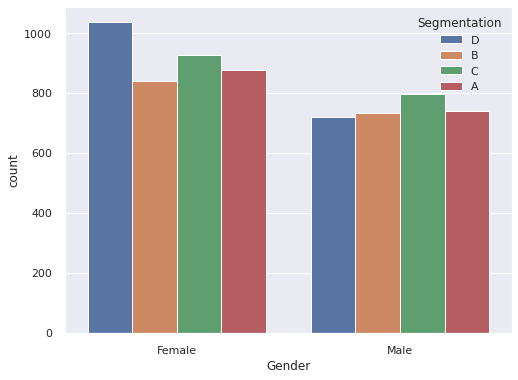

In [40]:
plt.figure(figsize=(8,6))
sns.countplot(x='Gender',hue='Segmentation',data= train_df_1)
plt.xticks([1,0]),['Male','Female']
plt.show()

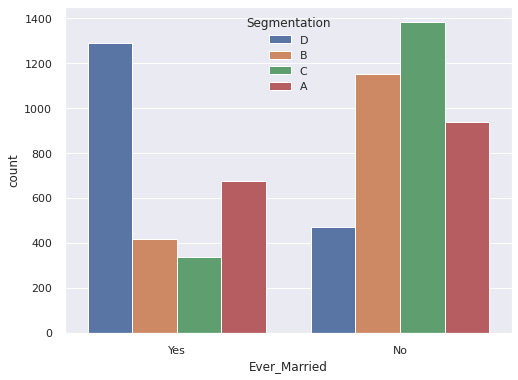

In [41]:
plt.figure(figsize=(8,6))
sns.countplot(x='Ever_Married',hue='Segmentation',data= train_df_1)
plt.xticks([1,0]),['Yes','No']
plt.show()

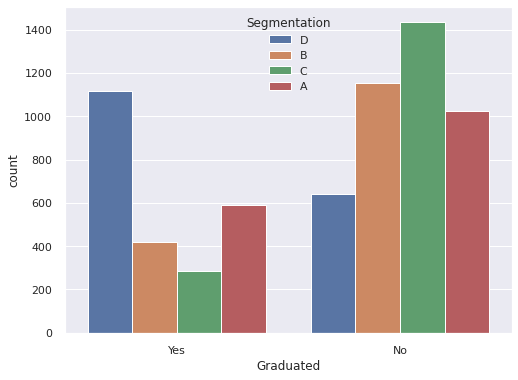

In [42]:
plt.figure(figsize=(8,6))
sns.countplot(x='Graduated',hue='Segmentation',data= train_df_1)
plt.xticks([1,0]),['Yes','No']
plt.show()

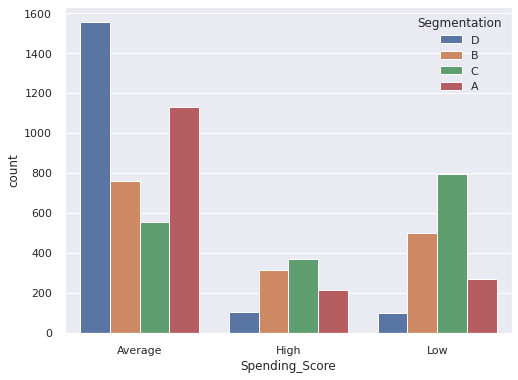

In [43]:
plt.figure(figsize=(8,6))
sns.countplot(x='Spending_Score',hue='Segmentation',data= train_df_1)
plt.xticks([2,1,0]),['Low','Average','High']
plt.show()

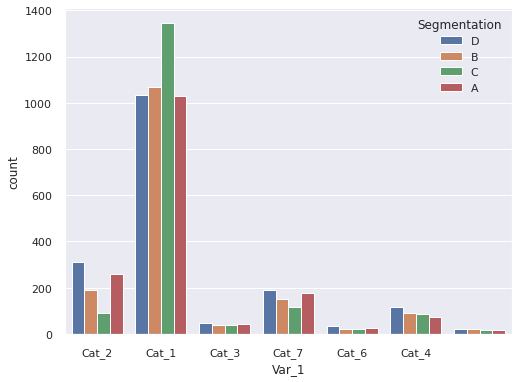

In [44]:
plt.figure(figsize=(8,6))
sns.countplot(x='Var_1',hue='Segmentation',data= train_df_1)

plt.xticks([5,4,3,2,1,0]),['Cat_7','Cat_6','Cat_5','Cat_4','Cat_3','Cat_2','Cat_1']

plt.show()

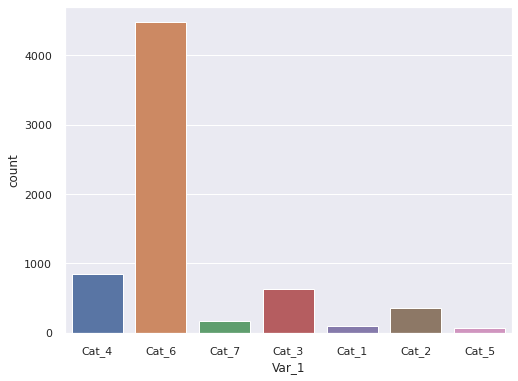

In [45]:
plt.figure(figsize=(8,6))
sns.countplot(x='Var_1',data= train_df_1)

#plt.xticks([5,4,3,2,1,0]),['Cat_7','Cat_6','Cat_5','Cat_4','Cat_3','Cat_2','Cat_1']

plt.show()

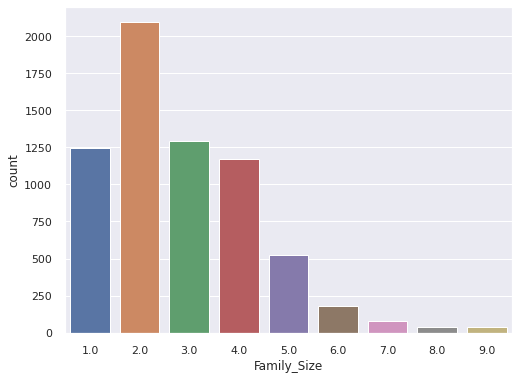

In [46]:
plt.figure(figsize=(8,6))
sns.countplot(x='Family_Size',data= train_df_1)
plt.show()

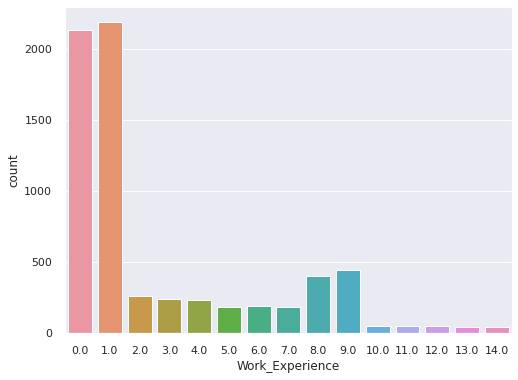

In [47]:
plt.figure(figsize=(8,6))
sns.countplot(x='Work_Experience',data= train_df_1)
plt.show()

In [48]:
#Sagar A-2
def continuous_plot(feature_name):
    plt.figure(figsize=(15,5))
    plt.suptitle('Distribution of numerical feature : {}'.format(feature_name), fontweight='heavy')
    plt.style.use('seaborn-dark-palette')
    plt.subplot(1,2,1)
    sns.histplot(data=train_df_1,x=feature_name , kde=True, color= 'tab:blue')

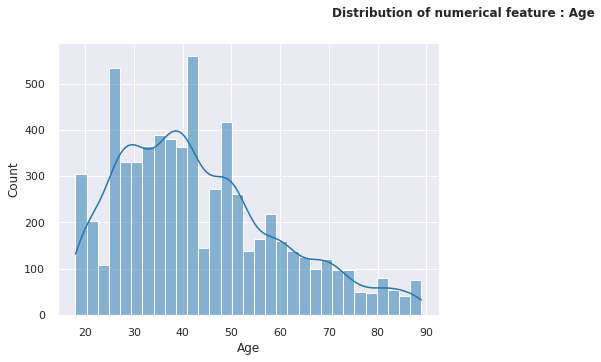

In [49]:
# Sagar Devesh A-2
continuous_features=['Age']
list(map(continuous_plot,continuous_features))
plt.show()



#### Label encoding for training

In [50]:
LE_gender = LabelEncoder()
LE_ever_married = LabelEncoder()
LE_graduated = LabelEncoder()
LE_profession = LabelEncoder()
LE_spending_score = LabelEncoder()
LE_var_1 = LabelEncoder()
LE_segmentation = LabelEncoder()

In [51]:
train_df_1['Gender'] = LE_gender.fit_transform(train_df_1['Gender'])
train_df_1['Ever_Married'] = LE_ever_married.fit_transform(train_df_1['Ever_Married'])
train_df_1['Graduated'] = LE_graduated.fit_transform(train_df_1['Graduated'])
train_df_1['Profession'] = LE_profession.fit_transform(train_df_1['Profession'])
train_df_1['Spending_Score'] = LE_spending_score.fit_transform(train_df_1['Spending_Score'])
train_df_1['Var_1'] = LE_var_1.fit_transform(train_df_1['Var_1'])
train_df_1['Segmentation'] = LE_segmentation.fit_transform(train_df_1['Segmentation'])
                                                           

In [52]:
train_df_1.head()

,ID,Gender,Ever_Married,Age,Graduated,Profession,Work_Experience,Spending_Score,Family_Size,Var_1,Segmentation
0,462809,1,0,22,0,5,1.0,2,4.0,3,3
2,466315,0,1,67,1,2,1.0,2,1.0,5,1
3,461735,1,1,67,1,7,0.0,1,2.0,5,1
5,461319,1,1,56,0,0,0.0,0,2.0,5,2
6,460156,1,0,32,1,5,1.0,2,3.0,5,2


#### Checking Outliers for test data

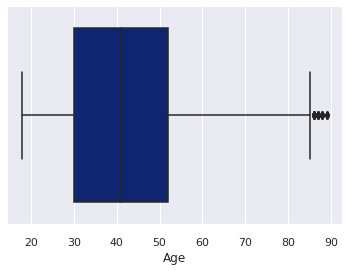

In [53]:
sns.boxplot(test_df_1['Age'])

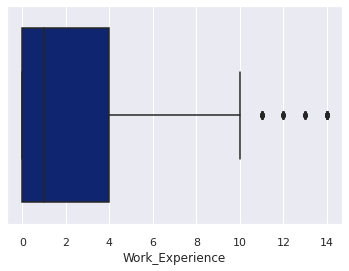

In [54]:
sns.boxplot(test_df_1['Work_Experience'])


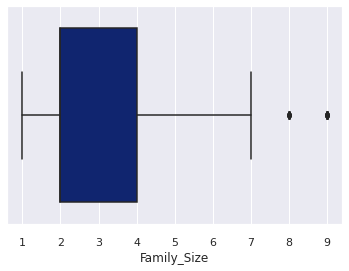

In [55]:
sns.boxplot(test_df_1['Family_Size'])


#### Checking Outliers for train data


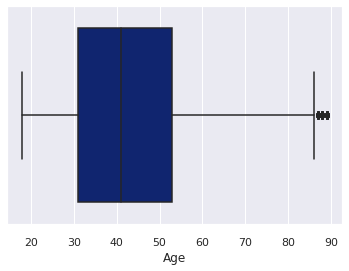

In [56]:
sns.boxplot(train_df_1['Age'])

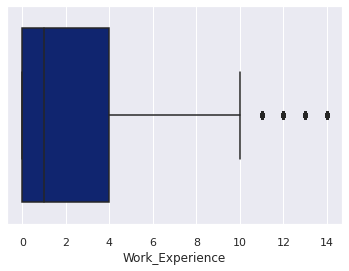

In [57]:
sns.boxplot(train_df_1['Work_Experience'])


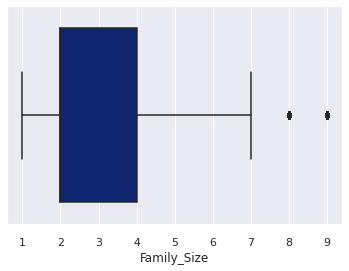

In [58]:
sns.boxplot(train_df_1['Family_Size'])


##### Plotted and visualized outliers , but we are not removing them because it all the values and relevant. For example a person might have considerably more years of work expirience but still it is relevant 

#### Normalization or training

In [59]:
train_df_1['Age'] = (train_df_1['Age'] - train_df_1['Age'].min()) / (train_df_1['Age'].max() - train_df_1['Age'].min()) 
train_df_1['Work_Experience'] = (train_df_1['Work_Experience'] - train_df_1['Work_Experience'].min()) / (train_df_1['Work_Experience'].max() - train_df_1['Work_Experience'].min()) 
train_df_1['Family_Size'] = (train_df_1['Family_Size'] - train_df_1['Family_Size'].min()) / (train_df_1['Family_Size'].max() - train_df_1['Family_Size'].min()) 

In [60]:
train_df_1.head()

,ID,Gender,Ever_Married,Age,Graduated,Profession,Work_Experience,Spending_Score,Family_Size,Var_1,Segmentation
0,462809,1,0,0.056338,0,5,0.071429,2,0.375,3,3
2,466315,0,1,0.690141,1,2,0.071429,2,0.000,5,1
3,461735,1,1,0.690141,1,7,0.000000,1,0.125,5,1
5,461319,1,1,0.535211,0,0,0.000000,0,0.125,5,2
6,460156,1,0,0.197183,1,5,0.071429,2,0.250,5,2


## Visualization

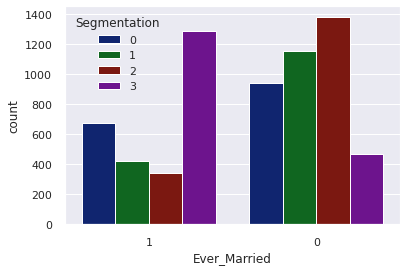

In [61]:
sns.countplot(x='Ever_Married',hue='Segmentation',data= train_df_1)
plt.xticks([1,0]),['Yes','No']
plt.show()

#### Pandas Profiling for training

#### Reference: https://stackoverflow.com/questions/60650617/error-while-running-profiling-report-using-pandas-giving-me-an-error-typeerror


In [62]:
pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip


In [63]:
import pandas_profiling
from pandas_profiling import ProfileReport

In [64]:
profile = ProfileReport(train_df_1, title="Pandas Profile Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### Label encoding for testing

In [65]:
LE_gender = LabelEncoder()
LE_ever_married = LabelEncoder()
LE_graduated = LabelEncoder()
LE_profession = LabelEncoder()
LE_spending_score = LabelEncoder()
LE_var_1 = LabelEncoder()
LE_segmentation = LabelEncoder()

In [66]:
test_df_1['Gender'] = LE_gender.fit_transform(test_df_1['Gender'])
test_df_1['Ever_Married'] = LE_ever_married.fit_transform(test_df_1['Ever_Married'])
test_df_1['Graduated'] = LE_graduated.fit_transform(test_df_1['Graduated'])
test_df_1['Profession'] = LE_profession.fit_transform(test_df_1['Profession'])
test_df_1['Spending_Score'] = LE_spending_score.fit_transform(test_df_1['Spending_Score'])
test_df_1['Var_1'] = LE_var_1.fit_transform(test_df_1['Var_1'])
                                                           

In [67]:
test_df_1.head()

,ID,Gender,Ever_Married,Age,Graduated,Profession,Work_Experience,Spending_Score,Family_Size,Var_1
0,458989,0,1,36,1,2,0.0,2,1.0,5
1,458994,1,1,37,1,5,8.0,0,4.0,5
3,459000,1,1,59,0,4,11.0,1,2.0,5
5,459003,1,1,47,1,1,0.0,1,5.0,3
6,459005,1,1,61,1,1,5.0,2,3.0,5


#### Normalization or testing

In [68]:
test_df_1['Age'] = (test_df_1['Age'] - test_df_1['Age'].min()) / (test_df_1['Age'].max() - test_df_1['Age'].min()) 
test_df_1['Work_Experience'] = (test_df_1['Work_Experience'] - test_df_1['Work_Experience'].min()) / (test_df_1['Work_Experience'].max() - test_df_1['Work_Experience'].min()) 
test_df_1['Family_Size'] = (test_df_1['Family_Size'] - test_df_1['Family_Size'].min()) / (test_df_1['Family_Size'].max() - test_df_1['Family_Size'].min()) 

In [69]:
test_df_1.shape

(2154, 10)

In [70]:
test_df_1.head()

,ID,Gender,Ever_Married,Age,Graduated,Profession,Work_Experience,Spending_Score,Family_Size,Var_1
0,458989,0,1,0.253521,1,2,0.000000,2,0.000,5
1,458994,1,1,0.267606,1,5,0.571429,0,0.375,5
3,459000,1,1,0.577465,0,4,0.785714,1,0.125,5
5,459003,1,1,0.408451,1,1,0.000000,1,0.500,3
6,459005,1,1,0.605634,1,1,0.357143,2,0.250,5


#### Pandas Profiling for training

In [71]:
profile = ProfileReport(test_df_1, title="Pandas Profile Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Preprocessing Ends


## Feature Selection Starts

### Pearson Correlation 

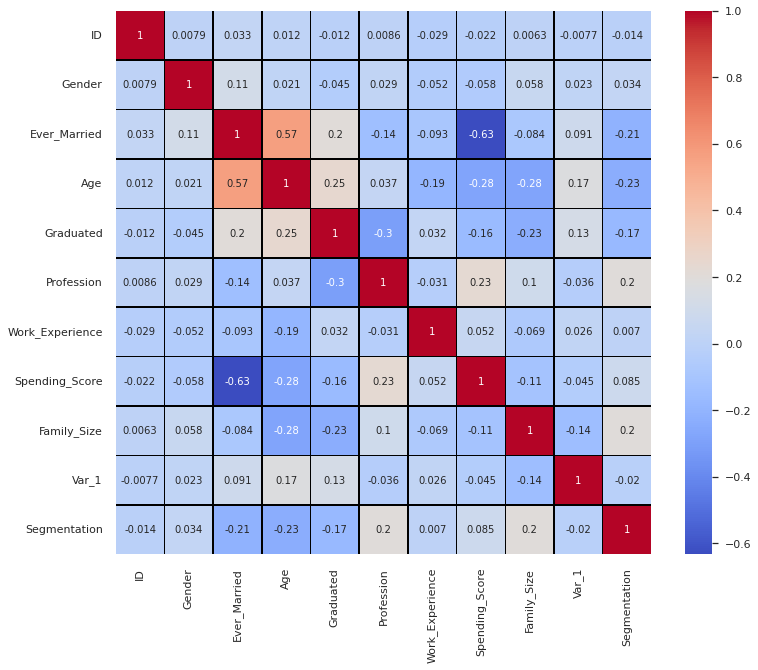

In [72]:
# Correlation Heatmap Sagar a2
plt.figure(figsize=(12,10))
cor = train_df_1.corr()
sns.heatmap(cor, annot=True, cmap='coolwarm',linewidths = 0.5,linecolor='black')
plt.show()

In [73]:
# referred A-2
def correlation(ds, t):
    column_corr = set() 
    corr_matrix = ds.corr()
    for n in range(len(corr_matrix.columns)):
        for m in range(n):
            if abs(corr_matrix.iloc[n, m]) > t:
                colname = corr_matrix.columns[n]
                column_corr.add(colname)
    return column_corr

In [74]:
correlation_features = correlation(train_df_1,0.6)
len(set(correlation_features))


1

In [75]:
correlation_features

{'Spending_Score'}

### Select K-best for training dataset 

In [76]:
X_train=train_df_1.drop(labels=['Segmentation'],axis=1)
y_train=train_df_1['Segmentation']

In [77]:

selector = SelectKBest(f_classif, k=10)
selector.fit(X_train, y_train)

SelectKBest()

In [78]:
# Displaying the scores
np.set_printoptions(precision=3)
print(selector.scores_)
print(X_train.columns.values)

[  2.562   4.704 496.432 418.458 354.514 334.469  20.752 523.054  92.011
  33.249]
['ID' 'Gender' 'Ever_Married' 'Age' 'Graduated' 'Profession'
 'Work_Experience' 'Spending_Score' 'Family_Size' 'Var_1']


In [79]:
feature_weights = dict(zip(X_train.columns.values, selector.scores_))
feature_weights

{'ID': 2.562196314082895,
 'Gender': 4.703688461272151,
 'Ever_Married': 496.4320021414216,
 'Age': 418.4579379602403,
 'Graduated': 354.51376472059906,
 'Profession': 334.4693226401739,
 'Work_Experience': 20.75182914025911,
 'Spending_Score': 523.053552582157,
 'Family_Size': 92.01077740063349,
 'Var_1': 33.248534498036946}

In [80]:
# Sorting the scores in descending order
feature_weights = dict(sorted(feature_weights.items(), key=lambda item: item[1], reverse=True))
feature_weights

{'Spending_Score': 523.053552582157,
 'Ever_Married': 496.4320021414216,
 'Age': 418.4579379602403,
 'Graduated': 354.51376472059906,
 'Profession': 334.4693226401739,
 'Family_Size': 92.01077740063349,
 'Var_1': 33.248534498036946,
 'Work_Experience': 20.75182914025911,
 'Gender': 4.703688461272151,
 'ID': 2.562196314082895}

In [81]:
X_train=X_train.drop(labels=['ID'],axis=1)
X_train.head()

,Gender,Ever_Married,Age,Graduated,Profession,Work_Experience,Spending_Score,Family_Size,Var_1
0,1,0,0.056338,0,5,0.071429,2,0.375,3
2,0,1,0.690141,1,2,0.071429,2,0.000,5
3,1,1,0.690141,1,7,0.000000,1,0.125,5
5,1,1,0.535211,0,0,0.000000,0,0.125,5
6,1,0,0.197183,1,5,0.071429,2,0.250,5


In [82]:
#Dropped ID from test
X_test=test_df_1.drop(labels=['ID'],axis=1)
X_test.head()

,Gender,Ever_Married,Age,Graduated,Profession,Work_Experience,Spending_Score,Family_Size,Var_1
0,0,1,0.253521,1,2,0.000000,2,0.000,5
1,1,1,0.267606,1,5,0.571429,0,0.375,5
3,1,1,0.577465,0,4,0.785714,1,0.125,5
5,1,1,0.408451,1,1,0.000000,1,0.500,3
6,1,1,0.605634,1,1,0.357143,2,0.250,5


In [83]:
X_test

,Gender,Ever_Married,Age,Graduated,Profession,Work_Experience,Spending_Score,Family_Size,Var_1
0,0,1,0.253521,1,2,0.000000,2,0.000,5
1,1,1,0.267606,1,5,0.571429,0,0.375,5
3,1,1,0.577465,0,4,0.785714,1,0.125,5
5,1,1,0.408451,1,1,0.000000,1,0.500,3
6,1,1,0.605634,1,1,0.357143,2,0.250,5
...,...,...,...,...,...,...,...,...,...
2621,0,0,0.239437,1,3,0.071429,2,0.125,5
2622,1,0,0.154930,0,5,0.642857,2,0.375,5
2623,0,0,0.239437,1,1,0.071429,2,0.000,5
2625,1,1,0.408451,1,4,0.071429,1,0.500,3


In [84]:
X_test.shape 

(2154, 9)

In [85]:
X_train.shape

(6665, 9)

In [86]:
conc_df= pd.concat([X_train, X_test], ignore_index=True, axis=0)
conc_df

,Gender,Ever_Married,Age,Graduated,Profession,Work_Experience,Spending_Score,Family_Size,Var_1
0,1,0,0.056338,0,5,0.071429,2,0.375,3
1,0,1,0.690141,1,2,0.071429,2,0.000,5
2,1,1,0.690141,1,7,0.000000,1,0.125,5
3,1,1,0.535211,0,0,0.000000,0,0.125,5
4,1,0,0.197183,1,5,0.071429,2,0.250,5
...,...,...,...,...,...,...,...,...,...
8814,0,0,0.239437,1,3,0.071429,2,0.125,5
8815,1,0,0.154930,0,5,0.642857,2,0.375,5
8816,0,0,0.239437,1,1,0.071429,2,0.000,5
8817,1,1,0.408451,1,4,0.071429,1,0.500,3


In [87]:
conc_df_dup = conc_df.duplicated().any()

In [88]:
conc_df_dup

True

In [89]:
print(conc_df.duplicated().sum())

1186


### K-Means Clustering 

### Silhoutte Measure

In [90]:
# # Sushu A-2 


# fig, ax = plt.subplots(2, 2, figsize=(15,8))
# for i in [2, 3, 4, 5]:
#     km = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=100, random_state=52)
#     q, mod = divmod(i, 2)
#     visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-1][mod])
#     visualizer.fit(X_train)
#     score = silhouette_score(X_train, km.labels_, metric='euclidean') #Silhouette measure 
#     print('Silhouetter Score: %.3f' % score)

In [91]:
# #Sushu A-2
# km = KMeans(n_clusters=4, random_state=42)
# y_km =km.fit_predict(X_train)
# y_km 

### Principle Component Analysis

In [92]:
# #Sush A-2
# pca=PCA()
# pca.fit(X_train)

In [93]:
# pca.explained_variance_ratio_

In [94]:
# #Referred to link [3] to plot graph for Cumulative Explained Variance
# plt.figure(figsize=(10,8))
# plt.plot(range(1,10),pca.explained_variance_ratio_.cumsum(),marker ='o', linestyle='--')
# plt.title('Variance')
# plt.xlabel('Componenets')
# plt.ylabel('Cumulative Explained Variance')

In [95]:
# pca=PCA(n_components=2)

In [96]:
# pca.fit(X_train)

In [97]:
# pca.transform(X_train)

In [98]:
# pca_scores = pca.transform(X_train)

In [99]:
# kmeans_pca = KMeans (n_clusters= 2, init = 'k-means++', random_state = 42)
# kmeans_pca.fit(pca_scores)

In [100]:
# Xtrain_pca_kmeans =pd.concat([X_train.reset_index(drop=True) , pd.DataFrame(pca_scores)], axis =1)
# Xtrain_pca_kmeans.columns.values[-2:] = ['New_1', 'New_2']
# Xtrain_pca_kmeans['Custumer K-means PCA'] = kmeans_pca.labels_
# Xtrain_pca_kmeans.head()

In [101]:
# Xtrain_pca_kmeans['Segment']=Xtrain_pca_kmeans['Custumer K-means PCA'].map({0:'A',1:'B',2:'C',3 :'D'})

In [102]:
# x_axis = Xtrain_pca_kmeans['New_2']
# y_axis = Xtrain_pca_kmeans['New_1']

# plt.figure(figsize = (10, 8))

# sns.scatterplot(x_axis, y_axis, hue = Xtrain_pca_kmeans['Segment'])
# plt.title('Clusters by PCA Components')
# plt.show()


#### Splitting the train dataset into train and validation data


In [163]:
X1_train, X1_Val, Y1_train, Y1_Val = train_test_split(X_train, y_train, test_size=0.1, random_state=1)

### Bernoulli Naive Bayes 

#### The assumption that all features are independent is not usually the case in real life so it makes naive bayes algorithm less accurate than complicated algorithms. Speed comes at a cost! https://towardsdatascience.com/naive-bayes-classifier-explained-50f9723571ed

In [164]:
Y1_train = pd.DataFrame(Y1_train)

In [165]:
y_train.head()

,Segmentation
0,3
2,1
3,1
5,2
6,2


In [106]:
Y1_train.shape

(5332, 1)

In [107]:
Y1_train

,Segmentation
4535,1
410,1
728,3
4338,1
4567,2
...,...
1110,1
6267,0
4805,3
284,2


In [108]:
X1_train.shape

(5332, 9)

In [109]:
y_train.shape

(6665,)

In [166]:
Y1_train.shape

(5998, 1)

In [110]:
y_train = pd.DataFrame(y_train)
y_train.head()

,Segmentation
0,3
2,1
3,1
5,2
6,2


In [190]:

classifier = BernoulliNB()


classifier.fit(X1_train,Y1_train)


y2_pred = classifier.predict(X1_Val)

In [112]:
print("Accuracy:",metrics.accuracy_score(Y1_Val, y2_pred))

Accuracy: 0.4418604651162791


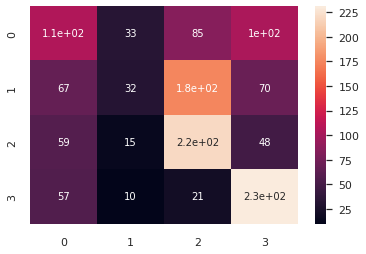

In [113]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(Y1_Val, y2_pred)
sns.heatmap(cm,annot=True)
plt.show()

In [114]:
from sklearn.metrics import classification_report
print(classification_report(Y1_Val, y2_pred))

              precision    recall  f1-score   support

           0       0.37      0.32      0.34       328
           1       0.36      0.09      0.15       344
           2       0.44      0.64      0.52       342
           3       0.51      0.72      0.60       319

    accuracy                           0.44      1333
   macro avg       0.42      0.45      0.40      1333
weighted avg       0.42      0.44      0.40      1333



#### Hyperparameter Tuning

#### Reference: https://www.kaggle.com/code/akshaysharma001/naive-bayes-with-hyperpameter-tuning

In [191]:
from sklearn.model_selection import RepeatedStratifiedKFold

cv_method = RepeatedStratifiedKFold(n_splits=10, 
                                    n_repeats=30, 
                                    random_state=999)

In [192]:
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import PowerTransformer
 
alpha = [0.001, 0.01, 0.1, 1, 10]
fit_prior = [True, False]

hyper={'alpha':alpha,'fit_prior':fit_prior}

gridsearch_NB = GridSearchCV(estimator=classifier, 
                     param_grid=hyper, 
                     cv=cv_method,
                     verbose=1, 
                     scoring='accuracy')

Data_transformed = PowerTransformer().fit_transform(X1_Val)

gridsearch_NB.fit(Data_transformed, Y1_Val)


Fitting 300 folds for each of 10 candidates, totalling 3000 fits


GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=30, n_splits=10, random_state=999),
             estimator=BernoulliNB(),
             param_grid={'alpha': [0.001, 0.01, 0.1, 1, 10],
                         'fit_prior': [True, False]},
             scoring='accuracy', verbose=1)

In [193]:
gridsearch_NB.best_params_

{'alpha': 0.001, 'fit_prior': False}

In [194]:
gridsearch_NB.best_score_

0.4913606211367405

#### Learning curve

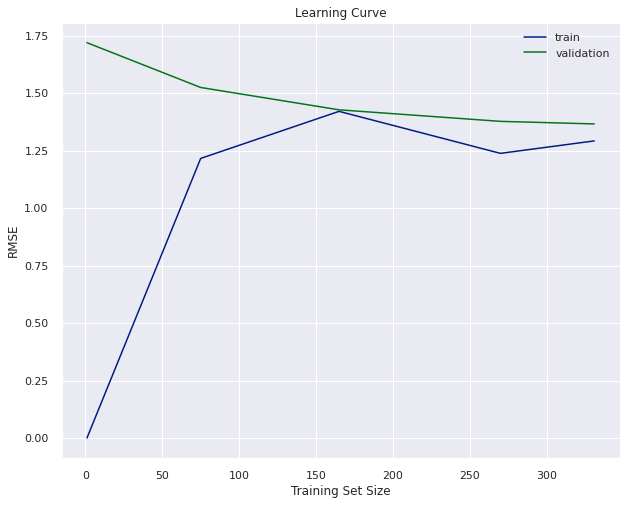

In [195]:
from sklearn.model_selection import learning_curve
classifier_HP = BernoulliNB(alpha=0.1, fit_prior= False)
train_sizes, train_scores, test_scores = learning_curve(
    estimator=classifier_HP,
    X=X1_train,
    y=Y1_train,
    cv=5,
    scoring="neg_root_mean_squared_error",
    train_sizes = [1, 75, 165, 270, 331]
)

train_mean = -train_scores.mean(axis=1)
test_mean = -test_scores.mean(axis=1)

plt.subplots(figsize=(10,8))
plt.plot(train_sizes, train_mean, label="train")
plt.plot(train_sizes, test_mean, label="validation")

plt.title("Learning Curve")
plt.xlabel("Training Set Size")
plt.ylabel("RMSE")
plt.legend(loc="best")

plt.show()


#### Model prediction on test data 

In [197]:

classifier_HP.fit(X1_train,Y1_train)
y2_pred_HP = classifier_HP.predict(X_test)
y_test_NB_HP['Segmentation'] = pd.DataFrame(y2_pred_HP)
#y_test_NB_HP=y_test_NB_HP.drop(labels=[0],axis=1)

y_test_NB_HP.head()


,Segmentation
0,0
1,2
2,3
3,1
4,1


### Gaussian Naive Bayes 

#### Reference: https://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.GaussianNB.html

In [120]:
classifier1 = GaussianNB()

classifier1.fit(X1_train,Y1_train)


y3_pred = classifier1.predict(X1_Val)

In [121]:
print("Accuracy:",metrics.accuracy_score(Y1_Val, y3_pred))

Accuracy: 0.47561890472618157


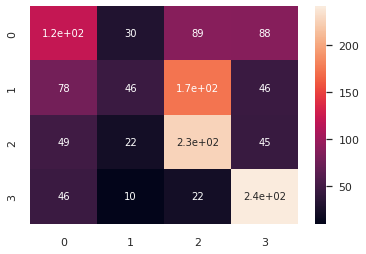

In [122]:
from sklearn.metrics import confusion_matrix


cm = confusion_matrix(Y1_Val, y3_pred)


sns.heatmap(cm,annot=True)
plt.show()


In [123]:
from sklearn.metrics import classification_report


print(classification_report(Y1_Val, y3_pred))

              precision    recall  f1-score   support

           0       0.41      0.37      0.39       328
           1       0.43      0.13      0.20       344
           2       0.44      0.66      0.53       342
           3       0.57      0.76      0.65       319

    accuracy                           0.48      1333
   macro avg       0.46      0.48      0.44      1333
weighted avg       0.46      0.48      0.44      1333



#### Hyperparameter Tuning 

Gaussian Naive Bayes does not really have any hyperparamters to tune unlike other machine learnig classifiers, except for var_smoothing. What we can do instead is to try repeated K-fold cross validation to get the best version of the Gaussian Naive Bayes model.

#### Reference: https://datascience.stackexchange.com/questions/73506/hyper-parameter-tuning-of-naivebayes-classier

In [124]:
cv_method_1 = RepeatedStratifiedKFold(n_splits=20, 
                                    n_repeats=10, 
                                    random_state=999)

In [125]:
params_GB = {'var_smoothing': np.logspace(0,-9, num=100)}

gridsearch_GB = GridSearchCV(estimator=classifier1, 
                     param_grid=params_GB, 
                     cv=cv_method_1,
                     verbose=1, 
                     scoring='accuracy')

Data_transformed_GB = PowerTransformer().fit_transform(X1_Val)

gridsearch_GB.fit(Data_transformed, Y1_Val)

Fitting 200 folds for each of 100 candidates, totalling 20000 fits


GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=10, n_splits=20, random_state=999),
             estimator=GaussianNB(),
             param_grid={'var_smoothing': array([1.000e+00, 8.111e-01, 6.579e-01, 5.337e-01, 4.329e-01, 3.511e-01,
       2.848e-01, 2.310e-01, 1.874e-01, 1.520e-01, 1.233e-01, 1.000e-01,
       8.111e-02, 6.579e-02, 5.337e-02, 4.329e-02, 3.511e-02, 2.848e-02,
       2.310e-02, 1.874e-02, 1.520e-02...
       1.000e-06, 8.111e-07, 6.579e-07, 5.337e-07, 4.329e-07, 3.511e-07,
       2.848e-07, 2.310e-07, 1.874e-07, 1.520e-07, 1.233e-07, 1.000e-07,
       8.111e-08, 6.579e-08, 5.337e-08, 4.329e-08, 3.511e-08, 2.848e-08,
       2.310e-08, 1.874e-08, 1.520e-08, 1.233e-08, 1.000e-08, 8.111e-09,
       6.579e-09, 5.337e-09, 4.329e-09, 3.511e-09, 2.848e-09, 2.310e-09,
       1.874e-09, 1.520e-09, 1.233e-09, 1.000e-09])},
             scoring='accuracy', verbose=1)

In [126]:
gridsearch_GB.best_params_

{'var_smoothing': 0.03511191734215131}

In [127]:
gridsearch_GB.best_score_

0.4859384893713252

#### Learning curve

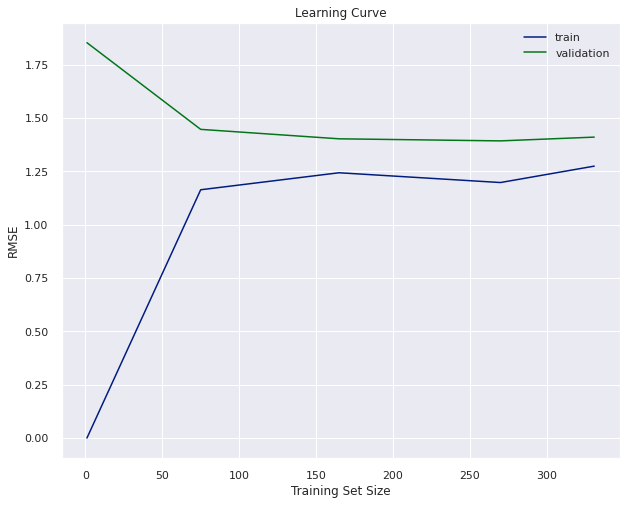

In [205]:
G_classifier_HP = GaussianNB(var_smoothing= 0.03511191734215131)

train_sizes, train_scores, test_scores = learning_curve(
    estimator=G_classifier_HP,
    X=X_train,
    y=y_train,
    cv=5,
    scoring="neg_root_mean_squared_error",
    train_sizes = [1, 75, 165, 270, 331]
)

train_mean = -train_scores.mean(axis=1)
test_mean = -test_scores.mean(axis=1)

plt.subplots(figsize=(10,8))
plt.plot(train_sizes, train_mean, label="train")
plt.plot(train_sizes, test_mean, label="validation")

plt.title("Learning Curve")
plt.xlabel("Training Set Size")
plt.ylabel("RMSE")
plt.legend(loc="best")

plt.show()

### Model Predictions on Test Data 

In [204]:
G_classifier_HP.fit(X1_train,Y1_train)
y2_pred_HP_G = G_classifier_HP.predict(X_test)
y_test_HP_G['Segmentation'] = pd.DataFrame(y2_pred_HP_G)
y_test_HP_G=y_test_NB_HP.drop(labels=[0])

y_test_HP_G.head()

,Segmentation
1,2
2,3
3,1
4,1
5,2


#### Reference for above: https://www.kaggle.com/code/akshaysharma001/naive-bayes-with-hyperpameter-tuning

## DecisionTree

In [129]:
clf = DecisionTreeClassifier(criterion='entropy')
clf1 = clf.fit(X1_train,Y1_train)
Y1_pred = clf1.predict(X1_Val)

print("Accuracy:",metrics.accuracy_score(Y1_Val, Y1_pred))



Accuracy: 0.44111027756939236


In [130]:
fn=X_train.keys()
cn=['A','B','C','D']

#### Hyperparameter tuning

In [231]:
from scipy.stats import randint
from sklearn.model_selection import RandomizedSearchCV
#Sagar A1
param_dist = {"max_depth": [3, None],
              "min_samples_split": randint(1,9),
              "min_samples_leaf": randint(1, 9),
             }

tree_1 = RandomizedSearchCV(clf, param_dist)
tree_1.fit(X1_train,Y1_train)



RandomizedSearchCV(estimator=DecisionTreeClassifier(criterion='entropy'),
                   param_distributions={'max_depth': [3, None],
                                        'min_samples_leaf': <scipy.stats._distn_infrastructure.rv_frozen object at 0x7efe448d0bb0>,
                                        'min_samples_split': <scipy.stats._distn_infrastructure.rv_frozen object at 0x7efe44895670>})

In [226]:
print("Tuned Decision Tree Parameters: {}".format(tree_1.best_params_))
print("Best score is {}".format(tree_1.best_score_))

Tuned Decision Tree Parameters: {'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 7}
Best score is 0.4863268001112038


In [133]:
plt.figure(figsize=(150,150))  
tree.plot_tree(clf1,feature_names = fn,class_names=cn,filled=True)
plt.show()
plt.savefig('decisiontree_plot.png')  

<Figure size 432x288 with 0 Axes>

#### Learning curve

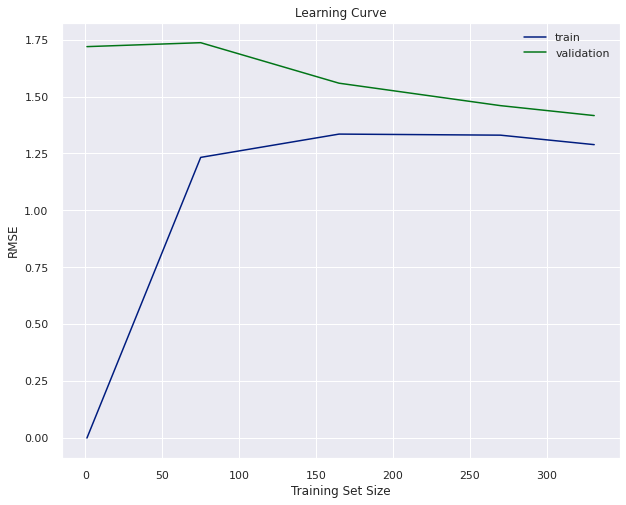

In [228]:
clf_2_HP = tree.DecisionTreeClassifier(max_depth= 3, min_samples_leaf= 1, min_samples_split= 7)

train_sizes, train_scores, test_scores = learning_curve(
    estimator=clf_2_HP,
    X=X1_train,
    y=Y1_train,
    cv=5,
    scoring="neg_root_mean_squared_error",
    train_sizes = [1, 75, 165, 270, 331]
)

train_mean = -train_scores.mean(axis=1)
test_mean = -test_scores.mean(axis=1)

plt.subplots(figsize=(10,8))
plt.plot(train_sizes, train_mean, label="train")
plt.plot(train_sizes, test_mean, label="validation")

plt.title("Learning Curve")
plt.xlabel("Training Set Size")
plt.ylabel("RMSE")
plt.legend(loc="best")

plt.show()

### Model Prediction on Test data

In [220]:


clf_2_HP.fit(X1_train,Y1_train)
Y1_pred_HP = clf_2_HP.predict(X_test)



In [222]:
Y1_pred_HP['Segmentation'] = pd.DataFrame(Y1_pred_HP)
Y1_pred_HP=Y1_pred_HP.drop(labels=[0],axis=1)

Y1_pred_HP.head()

,Segmentation
0,0
1,1
2,1
3,1
4,1


### Random Forest

In [235]:
clf_rf=RandomForestClassifier(n_estimators=100)
clf_rf.fit(X1_train,Y1_train) 
y_pred_rf=clf_rf.predict(X1_Val)



In [237]:
print("Accuracy:",metrics.accuracy_score(Y1_Val, y_pred_rf))

Accuracy: 0.5082458770614693


In [238]:
tree_small = clf_rf.estimators_[5]
export_graphviz(tree_small, out_file = 'small_tree.dot', feature_names = fn, rounded = True, precision = 1)
(graph, ) = pydot.graph_from_dot_file('small_tree.dot')
graph.write_png('small_tree.png');

#### Hyperparameter Tuning

In [239]:
param_grid = {
'n_estimators': [50, 100, 200, 300],
'min_samples_leaf': [1, 5, 10],
'max_depth': [2, 4, 6, 8, 10],
'max_features': ['auto', 'sqrt'],
'bootstrap': [True, False]}



forest_1_HP = RandomizedSearchCV(clf_rf, param_dist)
forest_1_HP.fit(X1_train,Y1_train)

RandomizedSearchCV(estimator=RandomForestClassifier(),
                   param_distributions={'max_depth': [3, None],
                                        'min_samples_leaf': <scipy.stats._distn_infrastructure.rv_frozen object at 0x7efe448d0bb0>,
                                        'min_samples_split': <scipy.stats._distn_infrastructure.rv_frozen object at 0x7efe44895670>})

In [242]:
print("Tuned Random Forest Parameters: {}".format(forest_1_HP.best_params_))
print("Best score is {}".format(forest_1_HP.best_score_))

Tuned Random Forest Parameters: {'max_depth': None, 'min_samples_leaf': 5, 'min_samples_split': 5}
Best score is 0.529838198498749


### Learning Curve

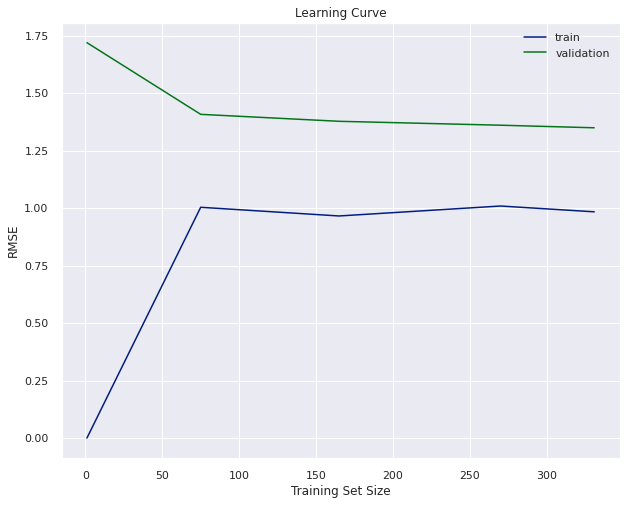

In [241]:
forest_2_HP = RandomForestClassifier(max_depth= None, min_samples_leaf= 5, min_samples_split= 5)

train_sizes, train_scores, test_scores = learning_curve(
    estimator=forest_2_HP,
    X=X1_train,
    y=Y1_train,
    cv=5,
    scoring="neg_root_mean_squared_error",
    train_sizes = [1, 75, 165, 270, 331]
)

train_mean = -train_scores.mean(axis=1)
test_mean = -test_scores.mean(axis=1)

plt.subplots(figsize=(10,8))
plt.plot(train_sizes, train_mean, label="train")
plt.plot(train_sizes, test_mean, label="validation")

plt.title("Learning Curve")
plt.xlabel("Training Set Size")
plt.ylabel("RMSE")
plt.legend(loc="best")

plt.show()

In [243]:
forest_2_HP.fit(X1_train,Y1_train)
Y1_pred_HP_RF = forest_2_HP.predict(X_test)

In [248]:
Y1_pred_HP_RF['Segmentation'] = pd.DataFrame(Y1_pred_HP_RF)
Y1_pred_HP_RF=Y1_pred_HP_RF.drop(labels=[0],axis=1)
Y1_pred_HP_RF.head()

,Segmentation
0,1
1,1
2,2
3,2
4,0


### reason for similar performance https://stats.stackexchange.com/questions/241062/why-decision-tree-is-outperforming-random-forest-in-this-simple-case

### XGBoost Classifier


In [249]:
pip install xgboost

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [250]:
# https://stackabuse.com/gradient-boosting-classifiers-in-python-with-scikit-learn/
xgb_clf = XGBClassifier()
xgb_clf.fit(X1_train,Y1_train)

XGBClassifier(objective='multi:softprob')

In [254]:
score_xgb = xgb_clf.score(X1_Val, Y1_Val)
print("Accuracy on validation set for XGB model: {:.2%}".format(score_xgb))

Accuracy on validation set for XGB model: 56.37%


#### Hyperparameter tuning

In [255]:
# A parameter grid for XGBoost
params = {
        'min_child_weight': [1, 5, 10, 15],
        'gamma': [0.5, 1, 1.5, 2, 5, 10, 15],
        'subsample': [0.6, 0.8, 1.0, 1,2],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [3, 4, 5, 6, 8, 10],
        'eta': [0.001, 0.01, 0.1, 1, 10],
        'learning_rate': [0.001, 0.01, 0.1, 1, 10]
        }

In [256]:
skf = RepeatedStratifiedKFold(n_splits=500, n_repeats=200, random_state = 1001)

rand_search_xg = RandomizedSearchCV(xgb_clf, param_distributions=params, n_iter=50, scoring='accuracy', n_jobs=-1, verbose=3)


In [257]:
Data_transformed_xg = PowerTransformer().fit_transform(X1_Val)
rand_search_xg.fit(Data_transformed_xg, Y1_Val, eval_metric='logloss')

Fitting 5 folds for each of 50 candidates, totalling 250 fits


RandomizedSearchCV(estimator=XGBClassifier(objective='multi:softprob'),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'colsample_bytree': [0.6, 0.8, 1.0],
                                        'eta': [0.001, 0.01, 0.1, 1, 10],
                                        'gamma': [0.5, 1, 1.5, 2, 5, 10, 15],
                                        'learning_rate': [0.001, 0.01, 0.1, 1,
                                                          10],
                                        'max_depth': [3, 4, 5, 6, 8, 10],
                                        'min_child_weight': [1, 5, 10, 15],
                                        'subsample': [0.6, 0.8, 1.0, 1, 2]},
                   scoring='accuracy', verbose=3)

In [258]:
rand_search_xg.best_params_

{'subsample': 1,
 'min_child_weight': 1,
 'max_depth': 5,
 'learning_rate': 0.01,
 'gamma': 1,
 'eta': 10,
 'colsample_bytree': 0.6}

In [259]:
rand_search_xg.best_score_


0.5262147907081135

#### Learning curve

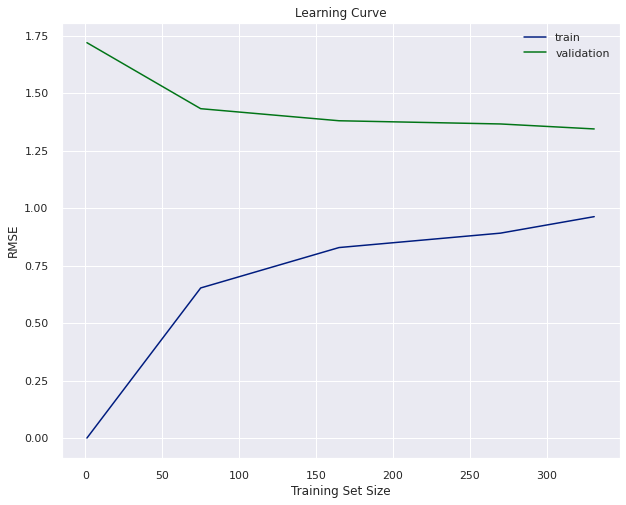

In [260]:

xgb_clf_HP = XGBClassifier(subsample= 1, min_child_weight= 1,max_depth= 5,learning_rate= 0.01,gamma= 1,eta= 10,colsample_bytree= 0.6)

train_sizes, train_scores, test_scores = learning_curve(
    estimator=xgb_clf_HP,
    X=X1_train,
    y=Y1_train,
    cv=5,
    scoring="neg_root_mean_squared_error",
    train_sizes = [1, 75, 165, 270, 331]
)

train_mean = -train_scores.mean(axis=1)
test_mean = -test_scores.mean(axis=1)

plt.subplots(figsize=(10,8))
plt.plot(train_sizes, train_mean, label="train")
plt.plot(train_sizes, test_mean, label="validation")

plt.title("Learning Curve")
plt.xlabel("Training Set Size")
plt.ylabel("RMSE")
plt.legend(loc="best")

plt.show()

In [261]:
xgb_clf_HP.fit(X1_train,Y1_train)
Y1_pred_HP_xgb = xgb_clf_HP.predict(X_test)

In [265]:
Y1_pred_HP_xgb['Segmentation'] = pd.DataFrame(Y1_pred_HP_xgb)
Y1_pred_HP_xgb=Y1_pred_HP_xgb.drop(labels=[0],axis=1)
Y1_pred_HP_xgb.head()

,Segmentation
0,0
1,2
2,2
3,1
4,1


### Multilayer Perceptron (Deep leanring)

In [153]:
import sklearn.neural_network as sknet
mlp = sknet.MLPClassifier(hidden_layer_sizes=(100,), random_state=42)
mlp.fit(X1_train,Y1_train)

MLPClassifier(random_state=42)

In [154]:
print("Accuracy on training set: {:.2%}".format(mlp.score(X1_train, Y1_train)))

Accuracy on training set: 56.15%


In [155]:
score = mlp.score(X1_Val, Y1_Val)
print("Accuracy on validation set: {:.2%}".format(score))

Accuracy on validation set: 52.89%


### Model Comparison
#### Reference: https://machinelearningmastery.com/compare-machine-learning-algorithms-python-scikit-learn/

Bernoulli NB: 0.447873 (0.040964)
Gaussian NB: 0.461289 (0.034825)
Decisiin Tree: 0.437358 (0.025940)
Random Forest: 0.492908 (0.044880)
XGB: 0.513057 (0.056446)
Multilayer Perceptron: 0.495214 (0.045458)


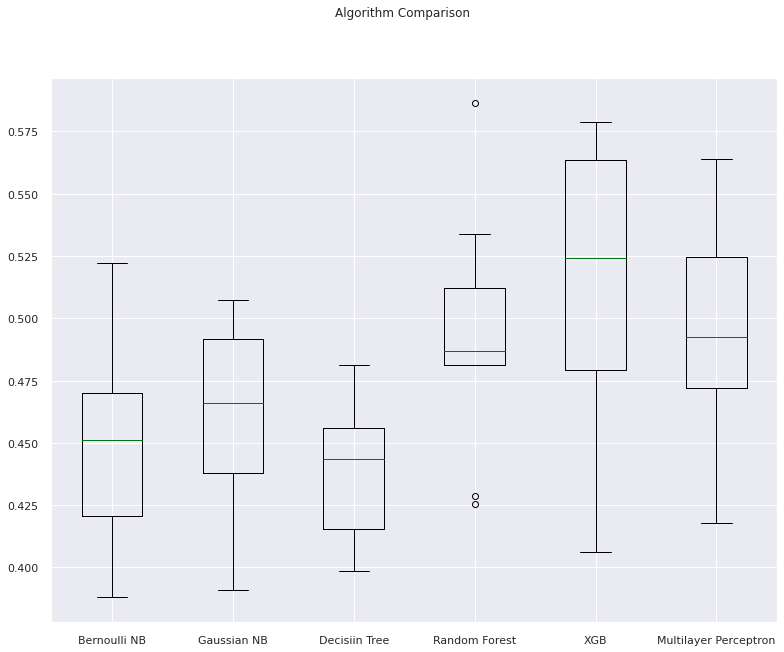

In [156]:

from sklearn import model_selection

models = []
models.append(('Bernoulli NB', classifier))
models.append(('Gaussian NB', classifier1))
models.append(('Decisiin Tree', clf_2))
models.append(('Random Forest', clf1))
models.append(('XGB', xgb_clf))
models.append(('Multilayer Perceptron', mlp))
# evaluate each model in turn
results = []
names = []
scoring = 'accuracy'
for name, model in models:
  kfold = model_selection.KFold(n_splits=10, shuffle=True, random_state=None)
  cv_results = model_selection.cross_val_score(model, X1_Val, Y1_Val, cv=kfold, scoring=scoring)
  results.append(cv_results)
  names.append(name)
  msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
  print(msg)
# boxplot algorithm comparison



fig = plt.figure(figsize=(13, 10))
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
# plt.figure(figsize=(15, 15))
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

### Statistical significance test

To compare the preformance of all the models, we will perform the statistical significance test.

Firstly, we will compare the Bernoulli Naive Bayes and Gaussioan Naive Bayes algorithms

In [ ]:
from scipy import stats 
from mlxtend.evaluate import paired_ttest_5x2cv

In [1]:
t, p = paired_ttest_5x2cv(estimator1=classifier,
                          estimator2=classifier1,
                          X=X1_train, y=Y1_train,
                          random_seed=1)
alpha = 0.05   

print('t statistic: %.3f' % t)
print('p value: %.3f' % p)

if p > alpha:
  print("Failed to reject null hypotesis since p-value > 0.05")
else:
  print("We can reject null hypotesis since p-value < 0.05. Hence we can conclude that both the models are significantly different")
  

NameError: ignored

Now, we will go ahead and compasrer one of the Naive Bayes models with the decison tree model

In [ ]:
t, p = paired_ttest_5x2cv(estimator1=classifier1,
                          estimator2=clf,
                          X=X1_train, y=Y1_train,
                          random_seed=1)
alpha = 0.05   

print('t statistic: %.3f' % t)
print('p value: %.3f' % p)

if p > alpha:
  print("Failed to reject null hypotesis since p-value > 0.05")
else:
  print("We can reject null hypotesis since p-value < 0.05. Hence we can conclude that both the models are significantly different")

t statistic: 1.668
p value: 0.156
Failed to reject null hypotesis since p-value > 0.05


In [ ]:
t, p = paired_ttest_5x2cv(estimator1=classifier1,
                          estimator2=clf1,
                          X=X1_train, y=Y1_train,
                          random_seed=1)
alpha = 0.05   

print('t statistic: %.3f' % t)
print('p value: %.3f' % p)

if p > alpha:
  print("Failed to reject null hypotesis since p-value > 0.05")
else:
  print("We can reject null hypotesis since p-value < 0.05. Hence we can conclude that both the models are significantly different")

t statistic: -0.883
p value: 0.418
Failed to reject null hypotesis since p-value > 0.05


# Explanation of learning curve https://www.datacamp.com/tutorial/tutorial-learning-curves

# CODE ends

# ANY CONCLUSIONS AND INSIGHTS GO HERE

- We will say in the report that the data in here - https://www.kaggle.com/code/fabiendaniel/customer-segmentation was not picked up because - (because of the conclusion) and also because we feel that the dataset is kind of incomplete because there is not description given of the product categories and also the customer's age, gender, etc. info. This makes it really difficult to interpolate the results of which group of customers bought what item.